In [1]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.cluster import DBSCAN
import hdbscan
from sklearn.cluster import  AgglomerativeClustering
from sklearn.preprocessing import MinMaxScaler,StandardScaler
import plotly.express as px

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

In [3]:
df = pd.read_csv('customer_merged_data_date.csv')

In [4]:
df.drop('Unnamed: 0',axis=1,inplace=True)

In [5]:
df.keys()

Index(['listing_id', 'id_x', 'date', 'reviewer_id', 'comments', 'neg', 'neu',
       'pos', 'compound', 'labels', 'id_y', 'host_response_time',
       'host_response_rate', 'host_acceptance_rate', 'host_is_superhost',
       'neighbourhood_group_cleansed', 'latitude', 'longitude',
       'property_type', 'room_type', 'accommodates', 'bedrooms', 'amenities',
       'price', 'guests_included', 'cleaning_fee', 'review_scores_value',
       'instant_bookable', 'cancellation_policy', 'reviews_per_month'],
      dtype='object')

In [6]:
df["Total_Cost"]= df.price + df.cleaning_fee
df["Total_Capacity"]= df.accommodates + df.guests_included

In [7]:
host_df = pd.read_csv('host_data.csv')

In [8]:
host_df.drop('Unnamed: 0',axis=1,inplace=True)

In [9]:
host_df.keys()

Index(['index', 'id', 'host_id', 'hosting_experience', 'host_response_time',
       'host_response_rate', 'host_acceptance_rate', 'host_is_superhost',
       'host_verifications', 'host_has_profile_pic', 'host_identity_verified',
       'calculated_host_listings_count', 'cancellation_policy',
       'review_scores_rating_y', 'Response_score', 'verification_score',
       'Hosting_Score'],
      dtype='object')

In [10]:
host_df=host_df[['id','Response_score', 'verification_score','Hosting_Score']]

In [11]:
df.listing_id.value_counts()

208356     461
365550     459
25002      402
47196      350
92835      318
          ... 
8194286      1
5602370      1
9167786      1
8566242      1
9727246      1
Name: listing_id, Length: 3182, dtype: int64

In [12]:
final_merged_data = pd.merge(left=df,right=host_df,how='inner',left_on='listing_id',right_on='id')

In [13]:
final_merged_data.keys()

Index(['listing_id', 'id_x', 'date', 'reviewer_id', 'comments', 'neg', 'neu',
       'pos', 'compound', 'labels', 'id_y', 'host_response_time',
       'host_response_rate', 'host_acceptance_rate', 'host_is_superhost',
       'neighbourhood_group_cleansed', 'latitude', 'longitude',
       'property_type', 'room_type', 'accommodates', 'bedrooms', 'amenities',
       'price', 'guests_included', 'cleaning_fee', 'review_scores_value',
       'instant_bookable', 'cancellation_policy', 'reviews_per_month',
       'Total_Cost', 'Total_Capacity', 'id', 'Response_score',
       'verification_score', 'Hosting_Score'],
      dtype='object')

In [14]:
final_df = final_merged_data[['reviewer_id','date','labels','Total_Cost','bedrooms','amenities','Total_Capacity','property_type','compound','Response_score',
       'verification_score', 'Hosting_Score']]

In [15]:
final_df

,reviewer_id,date,labels,Total_Cost,bedrooms,amenities,Total_Capacity,property_type,compound,Response_score,verification_score,Hosting_Score
0,28943674,2015-07-19,positive,90.0,1.0,"{Internet,""Wireless Internet"",Kitchen,Heating,...",3,Apartment,0.7717,1.000000,0.775,0.227099
1,32440555,2015-07-20,positive,90.0,1.0,"{Internet,""Wireless Internet"",Kitchen,Heating,...",3,Apartment,0.9858,1.000000,0.775,0.227099
2,37722850,2015-07-26,positive,90.0,1.0,"{Internet,""Wireless Internet"",Kitchen,Heating,...",3,Apartment,0.9325,1.000000,0.775,0.227099
3,33671805,2015-08-02,positive,90.0,1.0,"{Internet,""Wireless Internet"",Kitchen,Heating,...",3,Apartment,0.7579,1.000000,0.775,0.227099
4,34959538,2015-08-10,positive,90.0,1.0,"{Internet,""Wireless Internet"",Kitchen,Heating,...",3,Apartment,0.9738,1.000000,0.775,0.227099
...,...,...,...,...,...,...,...,...,...,...,...,...
59368,418689,2015-10-08,positive,125.0,0.0,"{TV,Internet,""Wireless Internet"",Kitchen,""Free...",5,Apartment,0.9371,1.000000,0.775,0.274419
59369,28432548,2015-10-20,positive,125.0,0.0,"{TV,Internet,""Wireless Internet"",Kitchen,""Free...",5,Apartment,0.9643,1.000000,0.775,0.274419
59370,13122605,2015-11-28,positive,125.0,0.0,"{TV,Internet,""Wireless Internet"",Kitchen,""Free...",5,Apartment,0.9365,1.000000,0.775,0.274419
59371,14341757,2015-12-24,positive,125.0,0.0,"{TV,Internet,""Wireless Internet"",Kitchen,""Free...",5,Apartment,0.9648,1.000000,0.775,0.274419


In [16]:
final_df.isnull().sum()

reviewer_id           0
date                  0
labels                0
Total_Cost            0
bedrooms              0
amenities             0
Total_Capacity        0
property_type         0
compound              0
Response_score        0
verification_score    0
Hosting_Score         0
dtype: int64

In [17]:
labels_encode = {'labels':{'positive':1,'neutral':0,'negative':-1}}

In [18]:
final_df.replace(labels_encode,inplace=True)

In [19]:
final_df.labels.value_counts()

 1    58374
 0      818
-1      181
Name: labels, dtype: int64

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


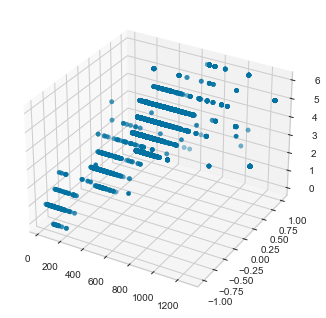

In [20]:
ax = plt.axes(projection ="3d")
ax.scatter3D(final_df.Total_Cost, final_df.labels, final_df.bedrooms)
ax.legend()

In [21]:
final_df['amenities'] = final_df['amenities'].apply(lambda x: x.replace('{','')
                                                              .replace('}','')
                                                              .replace('"','')
                                                              .replace(' ','_')
                                                              .replace(',',' ')
                                                              .split()
                                                             )

In [22]:
final_df['number_of_amenities']= final_df['amenities'].apply(lambda x: len(x))

In [23]:
final_df.drop('amenities',axis=1,inplace=True)

In [24]:
import datetime
import calendar

In [25]:
def findDay(date):
    born = datetime.datetime.strptime(date, '%Y-%m-%d').weekday()
    return (calendar.day_name[born])

In [26]:
findDay(final_df.date[0])

'Sunday'

In [27]:
final_df['date'] = final_df['date'].apply(findDay)

In [28]:
final_df.date.value_counts()

Monday       12554
Sunday       10036
Tuesday       9517
Saturday      7348
Wednesday     6900
Friday        6854
Thursday      6164
Name: date, dtype: int64

In [29]:
date_encode = {'date':{'Monday':1,'Tuesday':1,'Wednesday':1,'Thursday':1,'Friday':4,'Saturday':4,'Sunday':3}}

In [30]:
final_df.replace(date_encode,inplace=True)

In [31]:
final_df

,reviewer_id,date,labels,Total_Cost,bedrooms,Total_Capacity,property_type,compound,Response_score,verification_score,Hosting_Score,number_of_amenities
0,28943674,3,1,90.0,1.0,3,Apartment,0.7717,1.000000,0.775,0.227099,13
1,32440555,1,1,90.0,1.0,3,Apartment,0.9858,1.000000,0.775,0.227099,13
2,37722850,3,1,90.0,1.0,3,Apartment,0.9325,1.000000,0.775,0.227099,13
3,33671805,3,1,90.0,1.0,3,Apartment,0.7579,1.000000,0.775,0.227099,13
4,34959538,1,1,90.0,1.0,3,Apartment,0.9738,1.000000,0.775,0.227099,13
...,...,...,...,...,...,...,...,...,...,...,...,...
59368,418689,1,1,125.0,0.0,5,Apartment,0.9371,1.000000,0.775,0.274419,16
59369,28432548,1,1,125.0,0.0,5,Apartment,0.9643,1.000000,0.775,0.274419,16
59370,13122605,4,1,125.0,0.0,5,Apartment,0.9365,1.000000,0.775,0.274419,16
59371,14341757,1,1,125.0,0.0,5,Apartment,0.9648,1.000000,0.775,0.274419,16


In [32]:
final_df['property_score'] = (((final_df['number_of_amenities']/final_df['number_of_amenities'].max())*1.5+ (final_df['bedrooms']/final_df['bedrooms'].max())*0.8+ 
                               (final_df['Total_Capacity']/final_df['Total_Capacity'].max())*0.7)/3)

In [33]:
final_df['cost_score']=final_df['Total_Cost']*(1+final_df['compound'])
final_df['review_score'] = final_df['labels']*final_df['compound']

In [34]:
final_df

,reviewer_id,date,labels,Total_Cost,bedrooms,Total_Capacity,property_type,compound,Response_score,verification_score,Hosting_Score,number_of_amenities,property_score,cost_score,review_score
0,28943674,3,1,90.0,1.0,3,Apartment,0.7717,1.000000,0.775,0.227099,13,0.290278,159.4530,0.7717
1,32440555,1,1,90.0,1.0,3,Apartment,0.9858,1.000000,0.775,0.227099,13,0.290278,178.7220,0.9858
2,37722850,3,1,90.0,1.0,3,Apartment,0.9325,1.000000,0.775,0.227099,13,0.290278,173.9250,0.9325
3,33671805,3,1,90.0,1.0,3,Apartment,0.7579,1.000000,0.775,0.227099,13,0.290278,158.2110,0.7579
4,34959538,1,1,90.0,1.0,3,Apartment,0.9738,1.000000,0.775,0.227099,13,0.290278,177.6420,0.9738
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59368,418689,1,1,125.0,0.0,5,Apartment,0.9371,1.000000,0.775,0.274419,16,0.315278,242.1375,0.9371
59369,28432548,1,1,125.0,0.0,5,Apartment,0.9643,1.000000,0.775,0.274419,16,0.315278,245.5375,0.9643
59370,13122605,4,1,125.0,0.0,5,Apartment,0.9365,1.000000,0.775,0.274419,16,0.315278,242.0625,0.9365
59371,14341757,1,1,125.0,0.0,5,Apartment,0.9648,1.000000,0.775,0.274419,16,0.315278,245.6000,0.9648


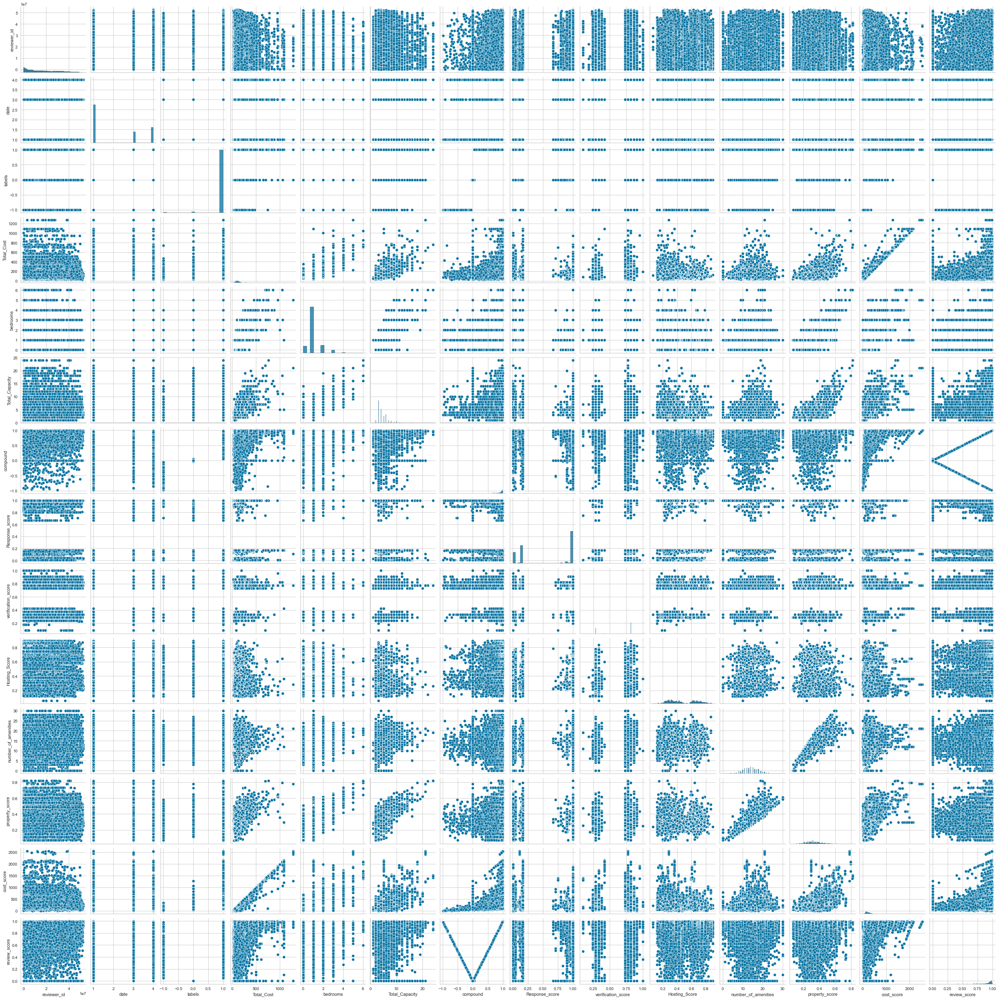

In [35]:
sns.pairplot(final_df)

In [36]:
final_df.keys()

Index(['reviewer_id', 'date', 'labels', 'Total_Cost', 'bedrooms',
       'Total_Capacity', 'property_type', 'compound', 'Response_score',
       'verification_score', 'Hosting_Score', 'number_of_amenities',
       'property_score', 'cost_score', 'review_score'],
      dtype='object')

<AxesSubplot:xlabel='property_score', ylabel='cost_score'>

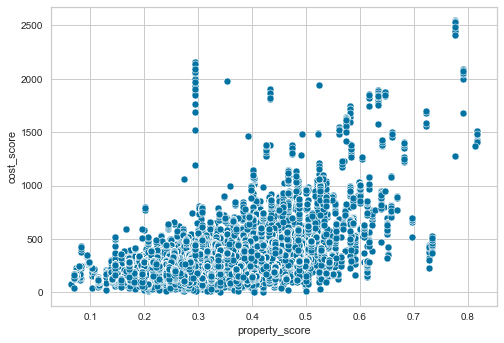

In [37]:
sns.scatterplot(final_df['property_score'],final_df['cost_score'])

<AxesSubplot:xlabel='property_score', ylabel='Hosting_Score'>

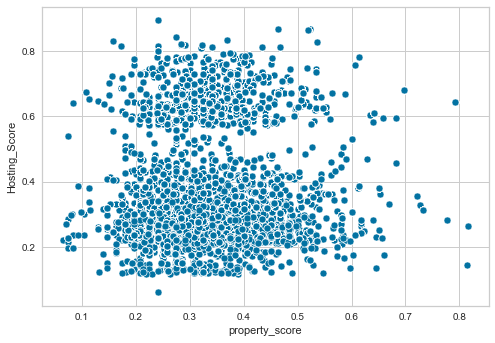

In [38]:
sns.scatterplot(final_df['property_score'],final_df['Hosting_Score'])

In [39]:
X2dim = final_df[['property_score','cost_score']]

Text(0, 0.5, 'wcss')

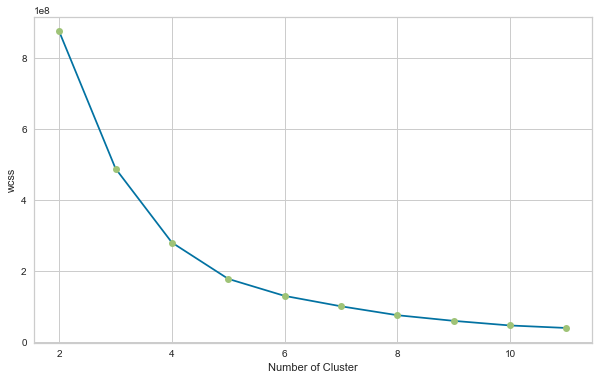

In [40]:
wcss=[]
r= range(2,12)

for i in r:
    kmeans = KMeans(n_clusters = i, init = 'k-means++',n_init=100)
    kmeans.fit(X2dim)
    wcss.append(kmeans.inertia_)
plt.subplots(figsize=(10,6))    
plt.plot(r,wcss)
plt.plot(r,wcss,"o")
#plt.axvline(x=5, color='r', linestyle='--')
plt.xlabel("Number of Cluster")
plt.ylabel("wcss")

<AxesSubplot:xlabel='property_score', ylabel='cost_score'>

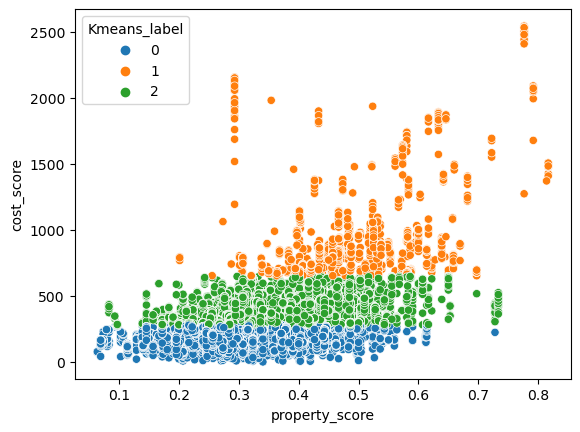

In [93]:
kmeans = KMeans(n_clusters=3)
X2dim["Kmeans_label"]= kmeans.fit_predict(X2dim)
sns.scatterplot(X2dim['property_score'],X2dim['cost_score'],hue=X2dim["Kmeans_label"],palette='tab10')

In [94]:
X2dim[['cost_score']]

,cost_score
0,159.4530
1,178.7220
2,173.9250
3,158.2110
4,177.6420
...,...
59368,242.1375
59369,245.5375
59370,242.0625
59371,245.6000


In [95]:
scalar = MinMaxScaler()
scalar.fit_transform(X2dim[['cost_score']])

array([[0.06214851],
       [0.06971896],
       [0.0678343 ],
       ...,
       [0.09460433],
       [0.09599415],
       [0.10208744]])

In [96]:
X2dim['cost_score'] = scalar.fit_transform(X2dim[['cost_score']])

In [42]:
X = final_df[['property_score','Hosting_Score','compound']]

In [124]:
X.rename(columns={'compound':'Review_Score'},inplace = True)

In [126]:
X.iloc[:,:3]

,property_score,Hosting_Score,Review_Score
0,0.290278,0.227099,0.7717
1,0.290278,0.227099,0.9858
2,0.290278,0.227099,0.9325
3,0.290278,0.227099,0.7579
4,0.290278,0.227099,0.9738
...,...,...,...
59368,0.315278,0.274419,0.9371
59369,0.315278,0.274419,0.9643
59370,0.315278,0.274419,0.9365
59371,0.315278,0.274419,0.9648


Text(0, 0.5, 'wcss')

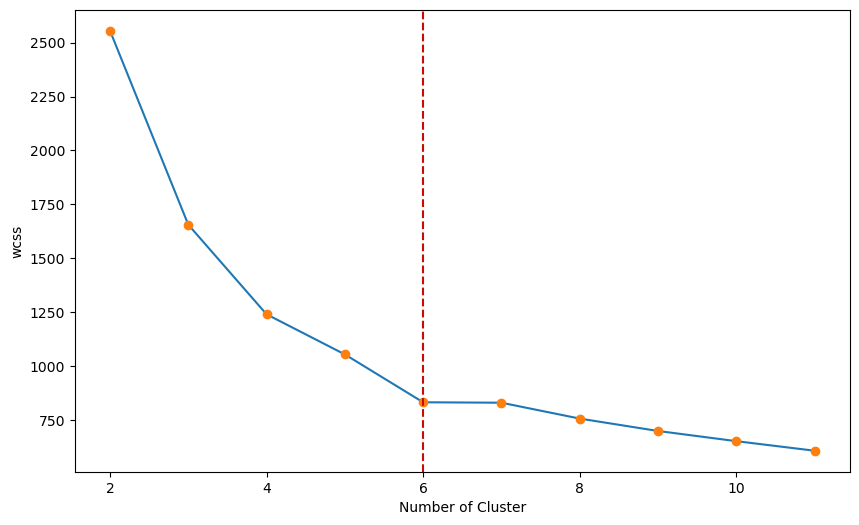

In [152]:
wcss=[]
r= range(2,12)

for i in r:
    kmeans = KMeans(n_clusters = i, init = 'k-means++',n_init=100)
    kmeans.fit(X.iloc[:,:3])
    wcss.append(kmeans.inertia_)
plt.subplots(figsize=(10,6))    
plt.plot(r,wcss)
plt.plot(r,wcss,"o")
plt.axvline(x=6, color='r', linestyle='--')
plt.xlabel("Number of Cluster")
plt.ylabel("wcss")

In the above picture, we can see the elbow point, which is 6. After that point, WSS is almost constant. So 6 is selected as K.In this way elbow method is used for finding the value of K.

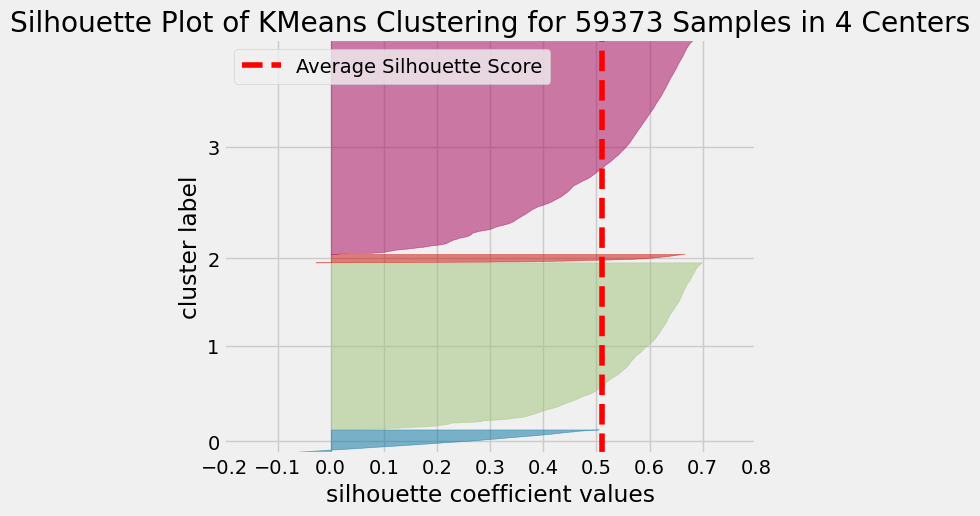

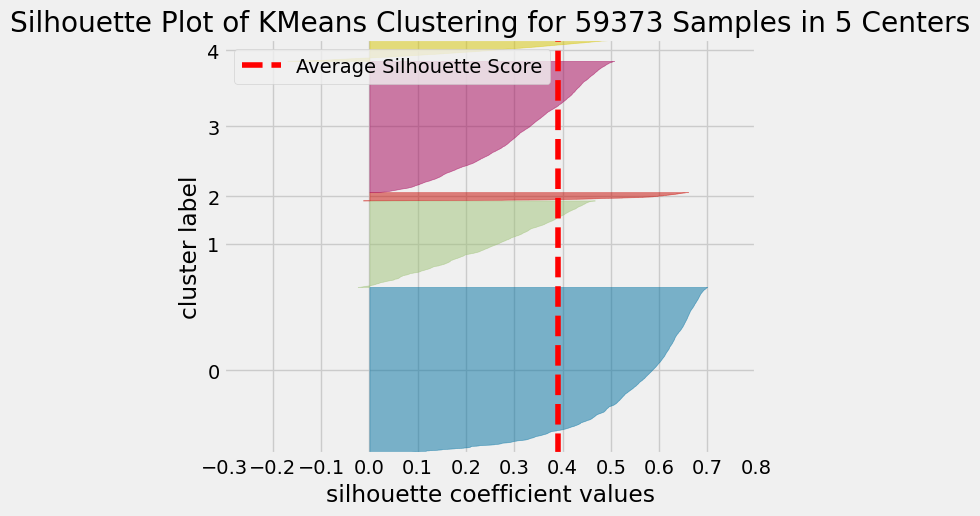

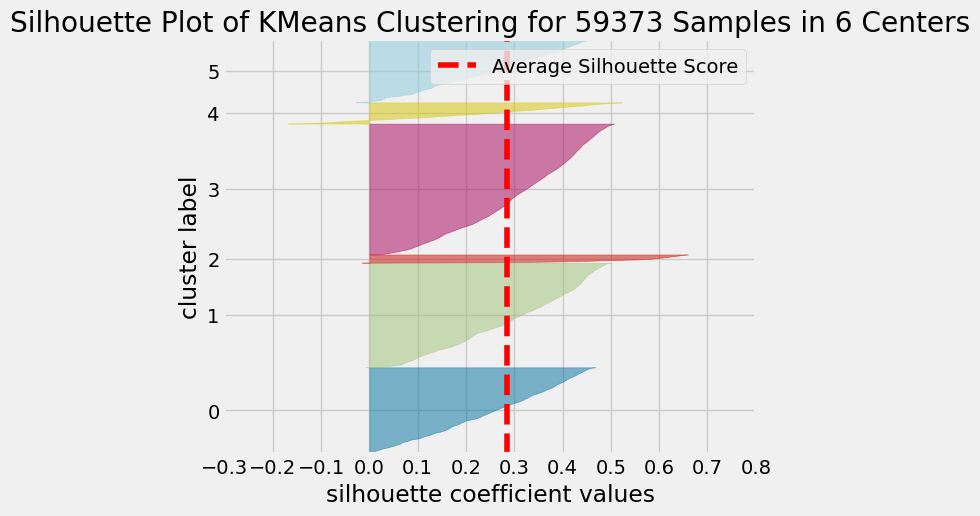

In [155]:
for i in [4,5,6]:
    plt.style.use("fivethirtyeight")
    model = KMeans(n_clusters=i  ,init= "k-means++",n_init=100,random_state=1)
    visualizer = SilhouetteVisualizer(model, colors='yellowbrick')
    
    visualizer.fit(X.iloc[:,:3])
    plt.tight_layout()
    visualizer.show()
    

In [150]:
wcss = [2555.6689085123307,
 1655.6104701140275,
 1239.9227168766843,
 1053.8483782949545,
 831.7646816139911,
 829.7266639291786,
 756.0763090349225,
 698.5693091739273,
 651.3271250281416,
 606.9782501619197]

In [82]:
kmeans = KMeans(n_clusters=6)
X["Kmeans_label"]= kmeans.fit_predict(X.iloc[:,:3])
#sns.scatterplot(X['property_score'],X['Hosting_Score'],hue=X["Kmeans_label"],palette='tab10')

In [83]:
X["Kmeans_label"].value_counts()

1    18836
2    14955
3    12400
0     8946
4     3058
5     1178
Name: Kmeans_label, dtype: int64

In [84]:
X

,property_score,Hosting_Score,compound,Kmeans_label
0,0.290278,0.227099,0.7717,1
1,0.290278,0.227099,0.9858,1
2,0.290278,0.227099,0.9325,1
3,0.290278,0.227099,0.7579,1
4,0.290278,0.227099,0.9738,1
...,...,...,...,...
59368,0.315278,0.274419,0.9371,1
59369,0.315278,0.274419,0.9643,1
59370,0.315278,0.274419,0.9365,1
59371,0.315278,0.274419,0.9648,1


Text(0.5, 0, 'Review Score')

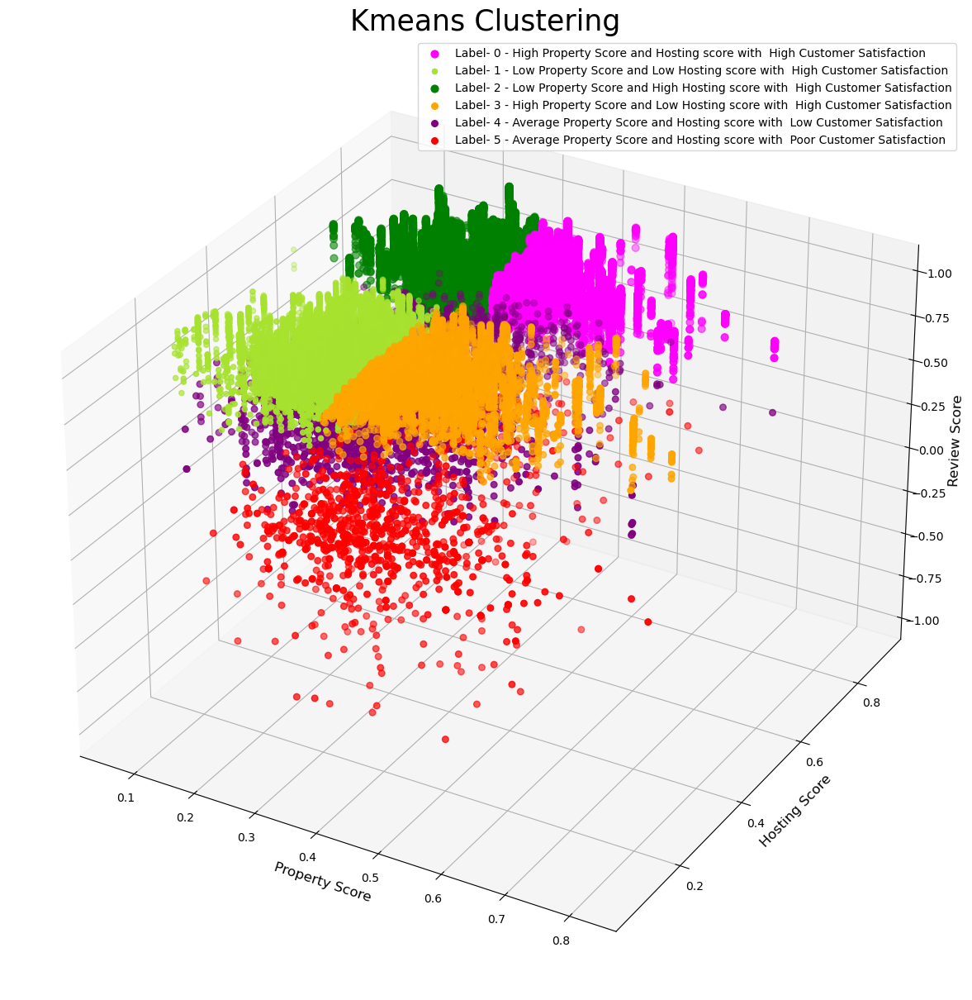

In [87]:
plt.style.use("default")
fig = plt.figure(figsize = (15,15))
ax = plt.axes(projection ="3d")
ax.scatter3D(X[X.Kmeans_label==0].property_score, X[X.Kmeans_label==0].Hosting_Score, X[X.Kmeans_label==0].Review_Score,c="fuchsia",s=40)

ax.scatter3D(X[X.Kmeans_label==1].property_score, X[X.Kmeans_label==1].Hosting_Score, X[X.Kmeans_label==1].Review_Score,c="#a6e22e",s=20,)

ax.scatter3D(X[X.Kmeans_label==2].property_score, X[X.Kmeans_label==2].Hosting_Score, X[X.Kmeans_label==2].Review_Score,c="green",s=40,)

ax.scatter3D(X[X.Kmeans_label==3].property_score, X[X.Kmeans_label==3].Hosting_Score, X[X.Kmeans_label==3].Review_Score,c="orange",s=30,)

ax.scatter3D(X[X.Kmeans_label==4].property_score, X[X.Kmeans_label==4].Hosting_Score, X[X.Kmeans_label==4].Review_Score,c="purple",s=30,)

ax.scatter3D(X[X.Kmeans_label==5].property_score, X[X.Kmeans_label==5].Hosting_Score, X[X.Kmeans_label==5].Review_Score,c="red",s=30,)

labels=["Label- 0 - High Property Score and Hosting score with  High Customer Satisfaction",
"Label- 1 - Low Property Score and Low Hosting score with  High Customer Satisfaction",
"Label- 2 - Low Property Score and High Hosting score with  High Customer Satisfaction",
"Label- 3 - High Property Score and Low Hosting score with  High Customer Satisfaction",
"Label- 4 - Average Property Score and Hosting score with  Low Customer Satisfaction",
"Label- 5 - Average Property Score and Hosting score with  Poor Customer Satisfaction"]
plt.legend(labels,loc="best")
ax.set_title("Kmeans Clustering",size=25)
ax.set_xlabel("Property Score",size=12)
ax.set_ylabel("Hosting Score",size=12)
ax.set_zlabel("Review Score",size=12)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Text(0.5, 0, 'Review Score')

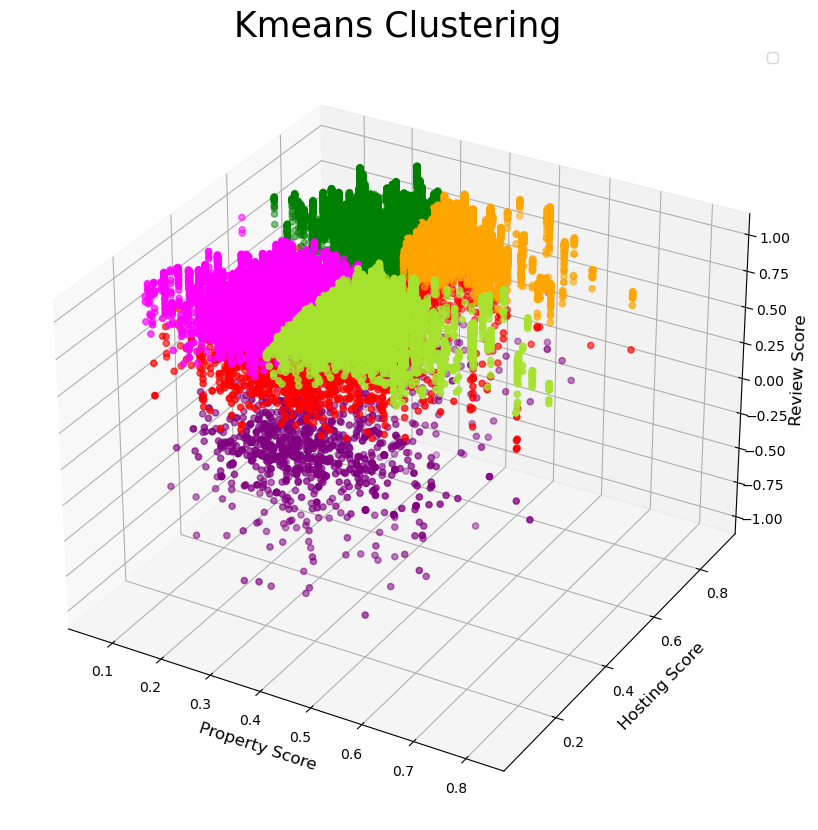

In [70]:
plt.style.use("default")
fig = plt.figure(figsize = (10,20))
ax = plt.axes(projection ="3d")
LABEL_COLOR_MAP = {0 : 'fuchsia',1 : '#a6e22e',2 : 'green',3 : 'orange',4 : 'purple', 5 : 'red'}
label_color = [LABEL_COLOR_MAP[l] for l in X["Kmeans_label"]]
ax.scatter3D(X['property_score'],X['Hosting_Score'], X['Review_Score'],c=label_color)
ax.legend()
ax.set_title("Kmeans Clustering",size=25)
ax.set_xlabel("Property Score",size=12)
ax.set_ylabel("Hosting Score",size=12)
ax.set_zlabel("Review Score",size=12)

In [76]:
px.scatter_3d(X, x='property_score', y='Hosting_Score', z='Review_Score',color="Kmeans_label")

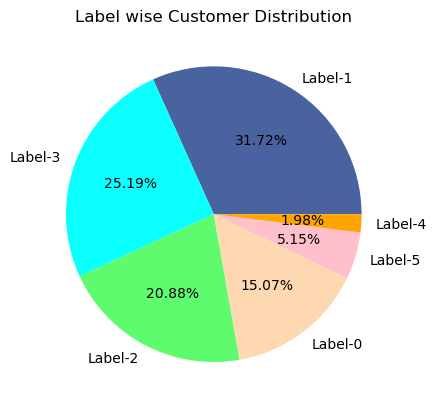

In [88]:
plt.pie(X['Kmeans_label'].value_counts(),labels=["Label-1","Label-3","Label-2","Label-0","Label-5","Label-4"],autopct="%.2f%%",colors=["#4863A0","#0AFFFF","#5EFB6E","#FED8B1","pink","orange"])
plt.title("Label wise Customer Distribution")
plt.show()

In [89]:
X.keys()

Index(['property_score', 'Hosting_Score', 'compound', 'Kmeans_label'], dtype='object')

In [90]:
pd.pivot_table(data= X,index="Kmeans_label",values=['property_score', 'Hosting_Score', 'Review_Score'],aggfunc="mean")

,Hosting_Score,compound,property_score
Kmeans_label,,,
0,0.699482,0.940696,0.428113
1,0.326880,0.934793,0.266526
2,0.677937,0.941069,0.282619
3,0.330906,0.939009,0.425342
4,0.406074,0.591825,0.318455
5,0.373791,-0.036621,0.329767


"Label- 0 - High Property Score and High Hosting score with  High Customer Satisfaction",

"Label- 1 - Low Property Score and Low Hosting score with  High Customer Satisfaction",

"Label- 2 - Low Property Score and High Hosting score with  High Customer Satisfaction",

"Label- 3 - High Property Score and Low Hosting score with  High Customer Satisfaction",

"Label- 4 - Average Property Score and Hosting score with  Medium Customer Satisfaction",

"Label- 5 - Average Property Score and Hosting score with  Poor Customer Satisfaction"

In [104]:
X

,property_score,Hosting_Score,Review_Score,Kmeans_label
0,0.290278,0.227099,0.7717,1
1,0.290278,0.227099,0.9858,1
2,0.290278,0.227099,0.9325,1
3,0.290278,0.227099,0.7579,1
4,0.290278,0.227099,0.9738,1
...,...,...,...,...
59368,0.315278,0.274419,0.9371,1
59369,0.315278,0.274419,0.9643,1
59370,0.315278,0.274419,0.9365,1
59371,0.315278,0.274419,0.9648,1


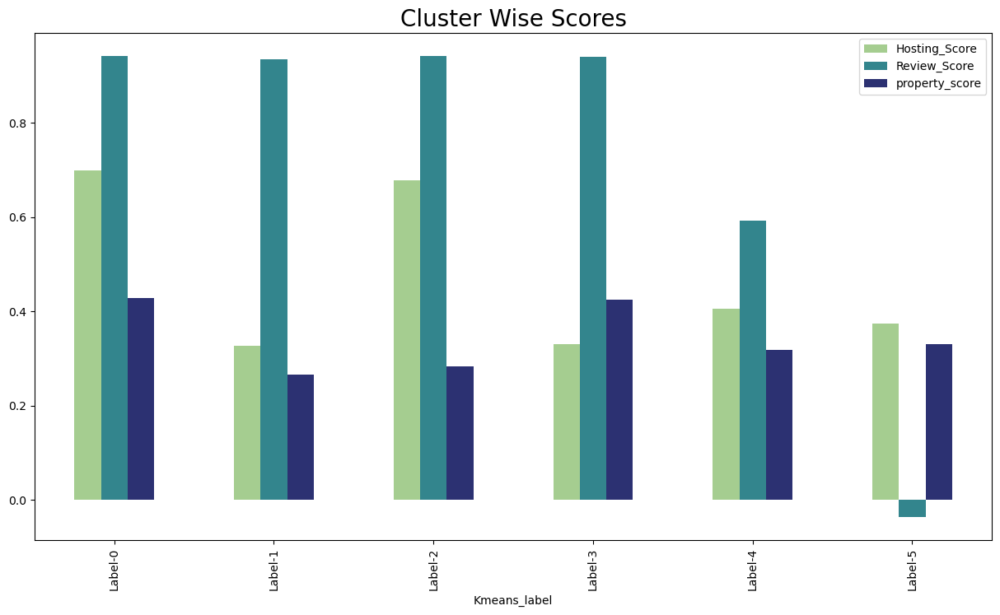

In [105]:
ax=pd.pivot_table(data= X,index="Kmeans_label",values=['property_score', 'Hosting_Score', 'Review_Score']).plot(kind="bar",figsize=(15,8),colormap='crest')
ax.set_xticklabels(["Label-0","Label-1","Label-2","Label-3","Label-4","Label-5",])
ax.legend(loc="best")
ax.set_title("Cluster Wise Scores",size=20)
plt.show()

"Label- 0 - High Property Score and High Hosting score with  High Customer Satisfaction",

"Label- 1 - Low Property Score and Low Hosting score with  High Customer Satisfaction",

"Label- 2 - Low Property Score and High Hosting score with  High Customer Satisfaction",

"Label- 3 - High Property Score and Low Hosting score with  High Customer Satisfaction",

"Label- 4 - Average Property Score and Hosting score with  Medium Customer Satisfaction",

"Label- 5 - Average Property Score and Hosting score with  Poor Customer Satisfaction"

"Label- 0 - Deluxe Customers",

"Label- 1 - Stoic Customers",

"Label- 2 - Host Oriented Customers",

"Label- 3 - Property Oriented Customers",

"Label- 4 - Mediocore Customers",

"Label- 5 - Unhappy Customers"

In [108]:
X.iloc[:,:3]

,property_score,Hosting_Score,Review_Score
0,0.290278,0.227099,0.7717
1,0.290278,0.227099,0.9858
2,0.290278,0.227099,0.9325
3,0.290278,0.227099,0.7579
4,0.290278,0.227099,0.9738
...,...,...,...
59368,0.315278,0.274419,0.9371
59369,0.315278,0.274419,0.9643
59370,0.315278,0.274419,0.9365
59371,0.315278,0.274419,0.9648


## Sampling the Data

In [110]:
data =  X.iloc[:,:3].sample(frac=.2,random_state=1)

## K-Means

Text(0, 0.5, 'wcss')

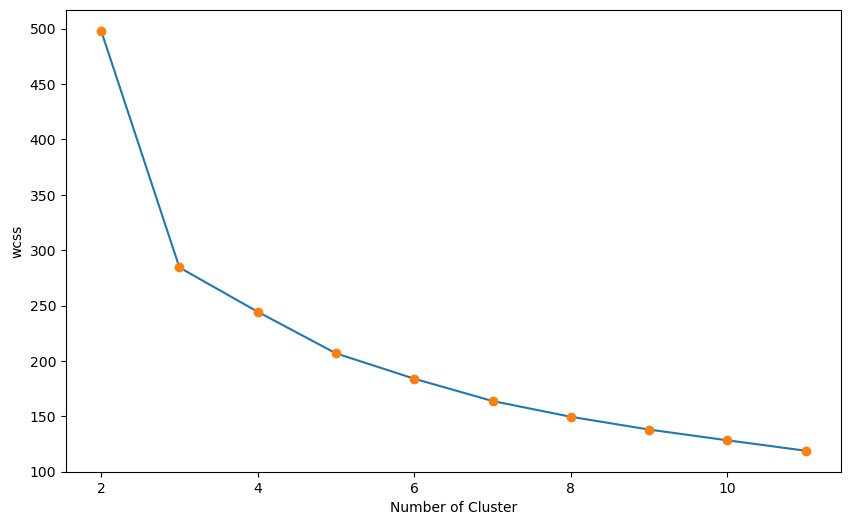

In [111]:
wcss=[]
r= range(2,12)

for i in r:
    kmeans = KMeans(n_clusters = i, init = 'k-means++',n_init=100)
    kmeans.fit(data)
    wcss.append(kmeans.inertia_)
plt.subplots(figsize=(10,6))    
plt.plot(r,wcss)
plt.plot(r,wcss,"o")
#plt.axvline(x=5, color='r', linestyle='--')
plt.xlabel("Number of Cluster")
plt.ylabel("wcss")

In [113]:
kmeans = KMeans(n_clusters=3)
data["Kmeans_label"]= kmeans.fit_predict(data)
#sns.scatterplot(X['property_score'],X['Hosting_Score'],hue=X["Kmeans_label"],palette='tab10')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Text(0.5, 0, 'Review Score')

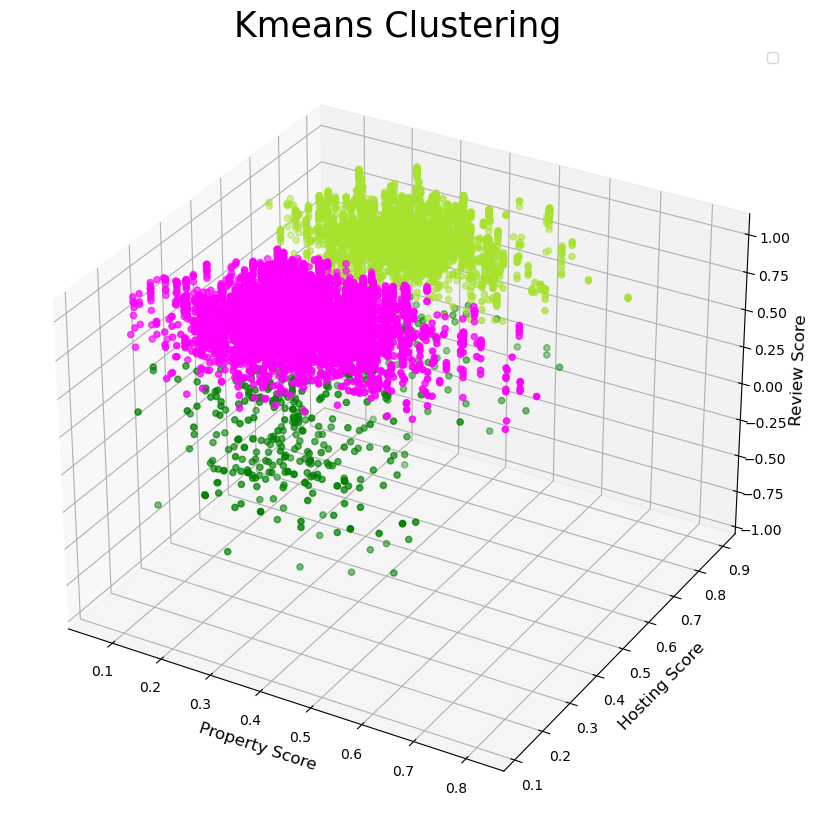

In [115]:
plt.style.use("default")
fig = plt.figure(figsize = (10,20))
ax = plt.axes(projection ="3d")
LABEL_COLOR_MAP = {0 : 'fuchsia',1 : '#a6e22e',2 : 'green',3 : 'orange',4 : 'purple', 5 : 'red'}
label_color = [LABEL_COLOR_MAP[l] for l in data["Kmeans_label"]]
ax.scatter3D(data['property_score'],data['Hosting_Score'], data['Review_Score'],c=label_color)
ax.legend()
ax.set_title("Kmeans Clustering",size=25)
ax.set_xlabel("Property Score",size=12)
ax.set_ylabel("Hosting Score",size=12)
ax.set_zlabel("Review Score",size=12)

## AgglomerativeClustering

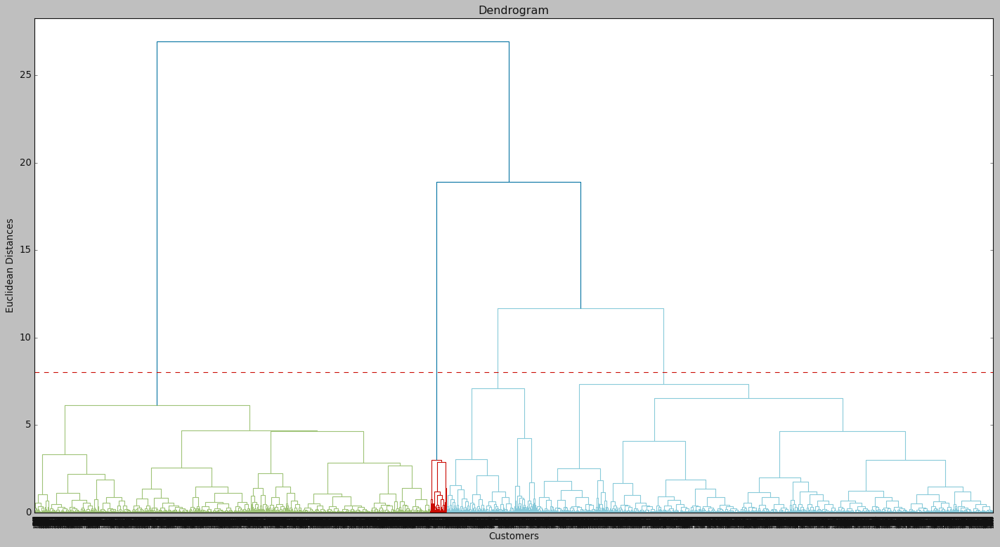

In [133]:
import scipy.cluster.hierarchy as sch
plt.style.use('classic')
plt.subplots(figsize=(22,11))
dendrogram = sch.dendrogram(sch.linkage(data.iloc[:,:3], method = 'ward'))
plt.title('Dendrogram')
plt.xlabel('Customers')
plt.ylabel('Euclidean Distances')
plt.axhline(y=8, color='r', linestyle='--')
plt.show() 

In [130]:
Agg = AgglomerativeClustering(n_clusters=4, linkage = 'ward')
data["Agg_label"]= Agg.fit_predict(data.iloc[:,:3])

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Text(0.5, 0, 'Review Score')

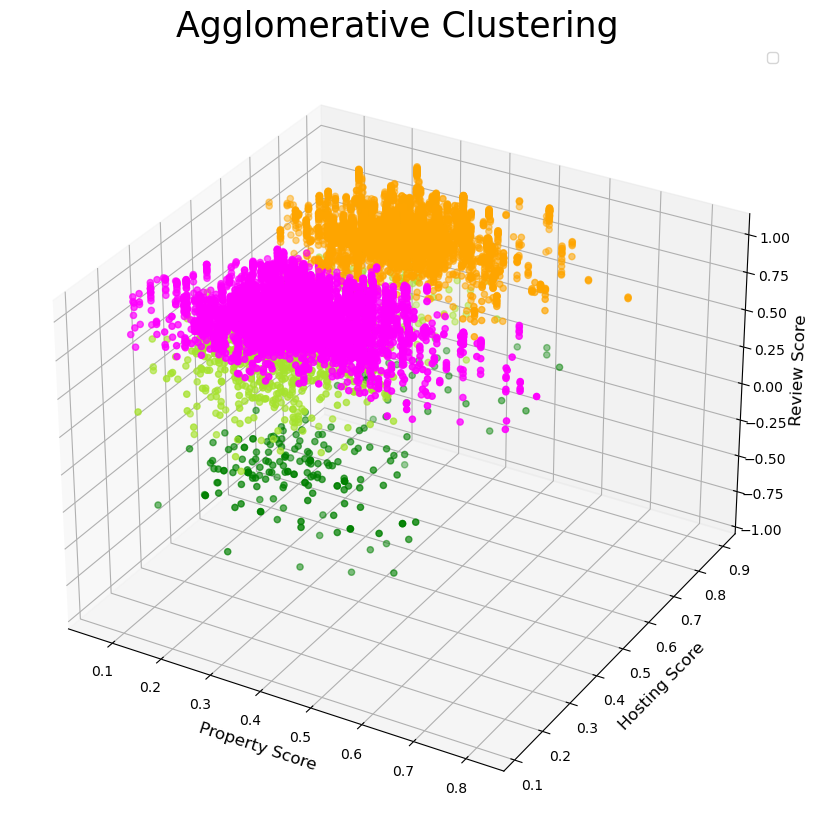

In [131]:
plt.style.use("default")
fig = plt.figure(figsize = (10,20))
ax = plt.axes(projection ="3d")
LABEL_COLOR_MAP = {0 : 'fuchsia',1 : '#a6e22e',2 : 'green',3 : 'orange',4 : 'purple', 5 : 'red'}
label_color = [LABEL_COLOR_MAP[l] for l in data["Agg_label"]]
ax.scatter3D(data['property_score'],data['Hosting_Score'], data['Review_Score'],c=label_color)
ax.legend()
ax.set_title("Agglomerative Clustering",size=25)
ax.set_xlabel("Property Score",size=12)
ax.set_ylabel("Hosting Score",size=12)
ax.set_zlabel("Review Score",size=12)

## DBSCAN

In [134]:
epsilon =  np.linspace(0.01,0.1,10)
size = range(3,10)
for i in epsilon:
    for j in size:
        dbscan = DBSCAN(eps = i,min_samples = j)
        labels_dbscan = dbscan.fit_predict(data.iloc[:,:3])
        clust_points = len(dbscan.core_sample_indices_)
        noise = len(data.iloc[:,:3])-len(dbscan.core_sample_indices_)
        if clust_points > 1.5*noise:
            print(f"For Epsilon = {round(i,2)} and min_cluster_size = {j} the clusters are {np.unique(labels_dbscan)}")
            print("Total number of data points assigned to clusters = ", clust_points)
            print("Total number of data points assigned to noise = ", noise)
            print("\n")

For Epsilon = 0.01 and min_cluster_size = 3 the clusters are [ -1   0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16
  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34
  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52
  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70
  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88
  89  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106
 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124
 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142
 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160
 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178
 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196
 197 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214
 215 216 217 218 219 220 221 222 223 224 225 226 227 228 229 23

For Epsilon = 0.03 and min_cluster_size = 8 the clusters are [-1  0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22
 23 24 25 26 27 28 29 30]
Total number of data points assigned to clusters =  10034
Total number of data points assigned to noise =  1841


For Epsilon = 0.03 and min_cluster_size = 9 the clusters are [-1  0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22
 23 24 25 26 27 28 29 30 31]
Total number of data points assigned to clusters =  9837
Total number of data points assigned to noise =  2038


For Epsilon = 0.04 and min_cluster_size = 3 the clusters are [-1  0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22
 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45]
Total number of data points assigned to clusters =  11455
Total number of data points assigned to noise =  420


For Epsilon = 0.04 and min_cluster_size = 4 the clusters are [-1  0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 2

For Epsilon = 0.09 and min_cluster_size = 4 the clusters are [-1  0  1  2]
Total number of data points assigned to clusters =  11791
Total number of data points assigned to noise =  84


For Epsilon = 0.09 and min_cluster_size = 5 the clusters are [-1  0  1  2]
Total number of data points assigned to clusters =  11772
Total number of data points assigned to noise =  103


For Epsilon = 0.09 and min_cluster_size = 6 the clusters are [-1  0  1  2]
Total number of data points assigned to clusters =  11751
Total number of data points assigned to noise =  124


For Epsilon = 0.09 and min_cluster_size = 7 the clusters are [-1  0  1]
Total number of data points assigned to clusters =  11727
Total number of data points assigned to noise =  148


For Epsilon = 0.09 and min_cluster_size = 8 the clusters are [-1  0  1]
Total number of data points assigned to clusters =  11704
Total number of data points assigned to noise =  171


For Epsilon = 0.09 and min_cluster_size = 9 the clusters are [-1  0

In [138]:
dbscan= DBSCAN(eps=0.1,min_samples=3)
data["dbscan_label"]= dbscan.fit_predict(data.iloc[:,:3])

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Text(0.5, 0, 'Review Score')

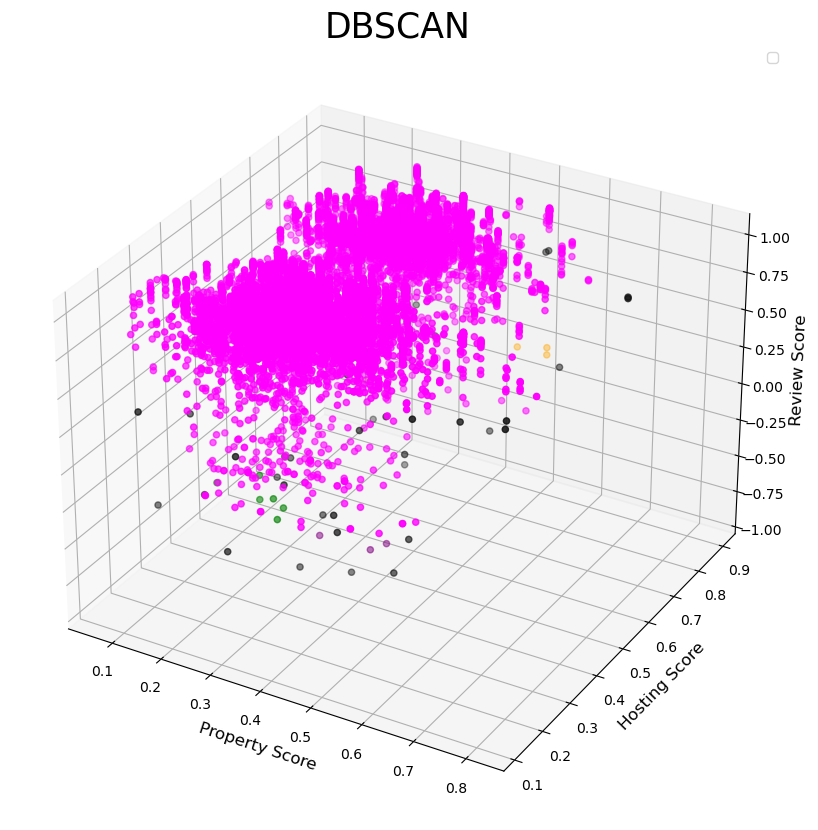

In [139]:
plt.style.use("default")
fig = plt.figure(figsize = (10,20))
ax = plt.axes(projection ="3d")
LABEL_COLOR_MAP = {0 : 'fuchsia',1 : '#a6e22e',2 : 'green',3 : 'orange',4 : 'purple', 5 : 'red',-1 : 'k'}
label_color = [LABEL_COLOR_MAP[l] for l in data["dbscan_label"]]
ax.scatter3D(data['property_score'],data['Hosting_Score'], data['Review_Score'],c=label_color)
ax.legend()
ax.set_title("DBSCAN",size=25)
ax.set_xlabel("Property Score",size=12)
ax.set_ylabel("Hosting Score",size=12)
ax.set_zlabel("Review Score",size=12)

## HDBSCAN

In [142]:
for j in range(3,100):
    clusterer = hdbscan.HDBSCAN(min_cluster_size=j, gen_min_span_tree=True)
    Hier_label = clusterer.fit_predict(data.iloc[:,:3])
    noise_perc = ((pd.Series(Hier_label).value_counts()[-1])/len(Hier_label))*100
    print(f"For min_cluster_size = {j} the clusters are {np.unique(Hier_label)}")
    print(f"Percentage of Data in Noise: {noise_perc}%")

For min_cluster_size = 3 the clusters are [  -1    0    1 ... 1014 1015 1016]
Percentage of Data in Noise: 36.05052631578947%
For min_cluster_size = 4 the clusters are [ -1   0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16
  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34
  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52
  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70
  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88
  89  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106
 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124
 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142
 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160
 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178
 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196
 197 198 199 200 201 202 203 

For min_cluster_size = 9 the clusters are [ -1   0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16
  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34
  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52
  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70
  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88
  89  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106
 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124
 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142
 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160
 161 162]
Percentage of Data in Noise: 60.60631578947368%
For min_cluster_size = 10 the clusters are [ -1   0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16
  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34
  35  36  37  38  39  40  41  42  43  44  45  46  47  

For min_cluster_size = 63 the clusters are [-1  0  1  2]
Percentage of Data in Noise: 7.023157894736842%
For min_cluster_size = 64 the clusters are [-1  0  1  2]
Percentage of Data in Noise: 7.12421052631579%
For min_cluster_size = 65 the clusters are [-1  0  1]
Percentage of Data in Noise: 1.8357894736842104%
For min_cluster_size = 66 the clusters are [-1  0  1  2]
Percentage of Data in Noise: 7.2084210526315795%
For min_cluster_size = 67 the clusters are [-1  0  1  2]
Percentage of Data in Noise: 7.334736842105263%
For min_cluster_size = 68 the clusters are [-1  0  1  2]
Percentage of Data in Noise: 7.435789473684211%
For min_cluster_size = 69 the clusters are [-1  0  1  2]
Percentage of Data in Noise: 7.51157894736842%
For min_cluster_size = 70 the clusters are [-1  0  1  2]
Percentage of Data in Noise: 7.59578947368421%
For min_cluster_size = 71 the clusters are [-1  0  1  2]
Percentage of Data in Noise: 7.663157894736843%
For min_cluster_size = 72 the clusters are [-1  0  1  2]
Pe

In [143]:
clusterer = hdbscan.HDBSCAN(min_cluster_size=26, gen_min_span_tree=True)
data["Hier_label"]=clusterer.fit_predict(data.iloc[:,:3])

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Text(0.5, 0, 'Review Score')

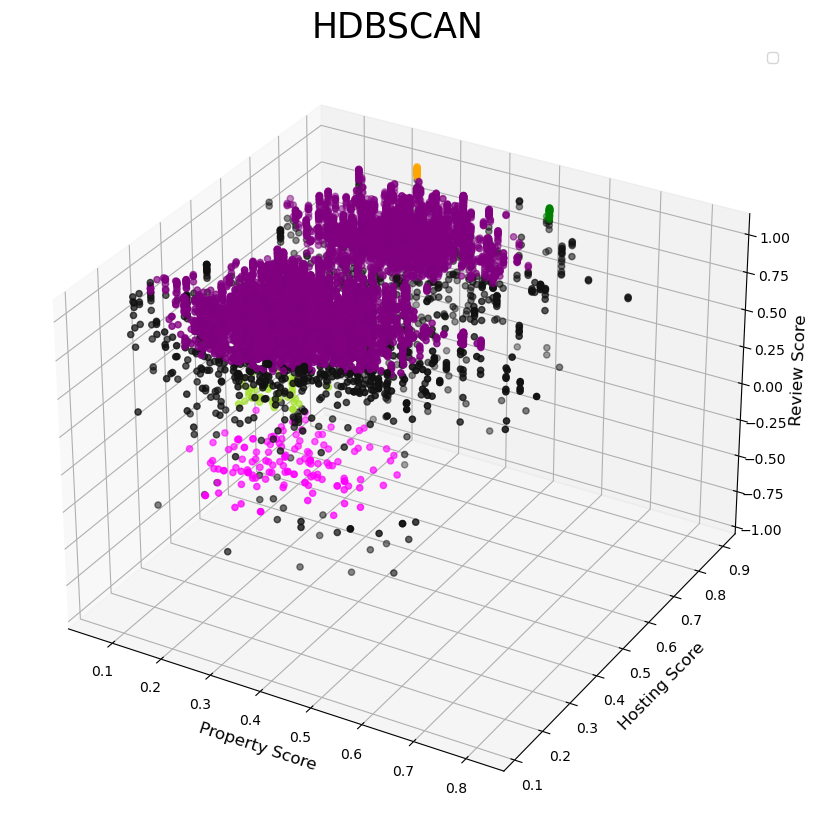

In [144]:
plt.style.use("default")
fig = plt.figure(figsize = (10,20))
ax = plt.axes(projection ="3d")
LABEL_COLOR_MAP = {0 : 'fuchsia',1 : '#a6e22e',2 : 'green',3 : 'orange',4 : 'purple', 5 : 'red',-1 : 'k'}
label_color = [LABEL_COLOR_MAP[l] for l in data["Hier_label"]]
ax.scatter3D(data['property_score'],data['Hosting_Score'], data['Review_Score'],c=label_color)
ax.legend()
ax.set_title("HDBSCAN",size=25)
ax.set_xlabel("Property Score",size=12)
ax.set_ylabel("Hosting Score",size=12)
ax.set_zlabel("Review Score",size=12)